##### Does LLaVa-Next-OneVision rely completely on parametric knowledge or can it understand subtle changes to the input and change it's answers accordingly?

- We take a sample image and question that asks about the color of an object.
- We then modify the image slightly to change the color of the object
- Observe if the answer is changed or not
- **NOTE**: LLaVa-Next has already "seen" multi-image WebQA data during training.

In [32]:
from llava.model.builder import load_pretrained_model
from llava.mm_utils import get_model_name_from_path, process_images, tokenizer_image_token
from llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN, DEFAULT_IM_START_TOKEN, DEFAULT_IM_END_TOKEN, IGNORE_INDEX
from llava.conversation import conv_templates, SeparatorStyle
from PIL import Image
from io import BytesIO
import base64
import requests
import copy
import torch
import sys
import warnings
import os
import os.path as osp
from webqa_test import get_multihop_image_prompt, get_multihop_text_prompt, get_si_prompt, get_single_text_prompt, get_ques_prompt
warnings.filterwarnings("ignore")


In [51]:
### Data paths
disk_root = "/mnt/disks/data/webqa"
data_dir = osp.join(disk_root, "WebQA_train_val.json")
ptb_data_dir = osp.join(disk_root, "perturbed", "train")
lineidx_dir = '/mnt/disks/data/webqa/imgs.lineidx'
images_dir = '/mnt/disks/data/webqa/imgs.tsv'

In [7]:
### Image handling
with open(lineidx_dir, "r") as fp_lineidx:
    lineidx = [int(i.strip()) for i in fp_lineidx.readlines()]

def read_image(image_id):
    with open(images_dir, "r") as fp:
        fp.seek(lineidx[int(image_id)%10000000])
        imgid, img_base64 = fp.readline().strip().split('\t')
    assert int(image_id) == int(imgid), f'{image_id} {imgid}'
    im = Image.open(BytesIO(base64.b64decode(img_base64)))
    if im.mode != 'RGB':
        im = im.convert('RGB')  # Convert to RGB if not already
    return im


def read_perturbed_img(image_id, qid, sample_id):
    img_name = f"{image_id}_{qid}_{sample_id}.jpeg"
    img_path = osp.join(ptb_data_dir, img_name)
    im = Image.open(img_path)
    if im.mode != 'RGB':
        im = im.convert('RGB')  # Convert to RGB if not already
    return im
    

In [25]:
### Load model
pretrained = "lmms-lab/llava-onevision-qwen2-7b-ov"
model_name = "llava_qwen"
device = "cuda"
device_map = "auto"
llava_model_args = {
        "multimodal": True,
    }
overwrite_config = {}
overwrite_config["image_aspect_ratio"] = "pad"
llava_model_args["overwrite_config"] = overwrite_config
tokenizer, model, image_processor, max_length = load_pretrained_model(pretrained, None, model_name, device_map=device_map, load_8bit=True, **llava_model_args)

model.eval()

Loaded LLaVA model: lmms-lab/llava-onevision-qwen2-7b-ov


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
You are using a model of type llava to instantiate a model of type llava_qwen. This is not supported for all configurations of models and can yield errors.
The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


Overwriting config with {'image_aspect_ratio': 'pad'}
Loading vision tower: google/siglip-so400m-patch14-384


Loading checkpoint shards: 100%|██████████| 4/4 [01:04<00:00, 16.07s/it]


Model Class: LlavaQwenForCausalLM


LlavaQwenForCausalLM(
  (model): LlavaQwenModel(
    (embed_tokens): Embedding(151647, 3584)
    (layers): ModuleList(
      (0-27): 28 x Qwen2DecoderLayer(
        (self_attn): Qwen2FlashAttention2(
          (q_proj): Linear8bitLt(in_features=3584, out_features=3584, bias=True)
          (k_proj): Linear8bitLt(in_features=3584, out_features=512, bias=True)
          (v_proj): Linear8bitLt(in_features=3584, out_features=512, bias=True)
          (o_proj): Linear8bitLt(in_features=3584, out_features=3584, bias=False)
          (rotary_emb): Qwen2RotaryEmbedding()
        )
        (mlp): Qwen2MLP(
          (gate_proj): Linear8bitLt(in_features=3584, out_features=18944, bias=False)
          (up_proj): Linear8bitLt(in_features=3584, out_features=18944, bias=False)
          (down_proj): Linear8bitLt(in_features=18944, out_features=3584, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): Qwen2RMSNorm()
        (post_attention_layernorm): Qwen2RMSNorm()
      )
 

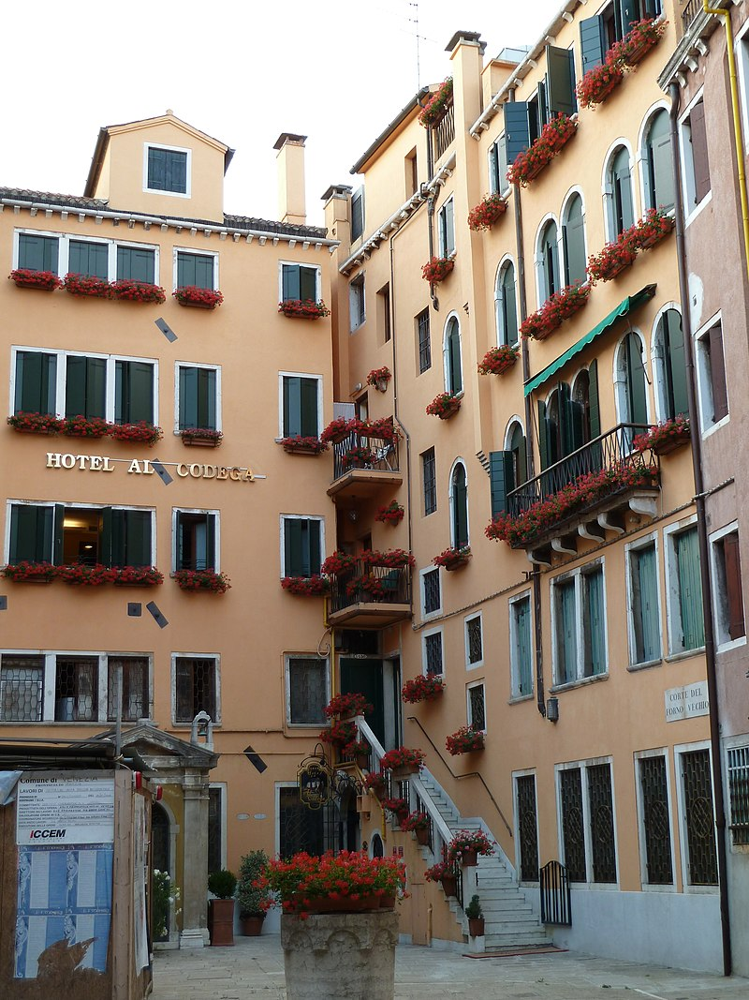

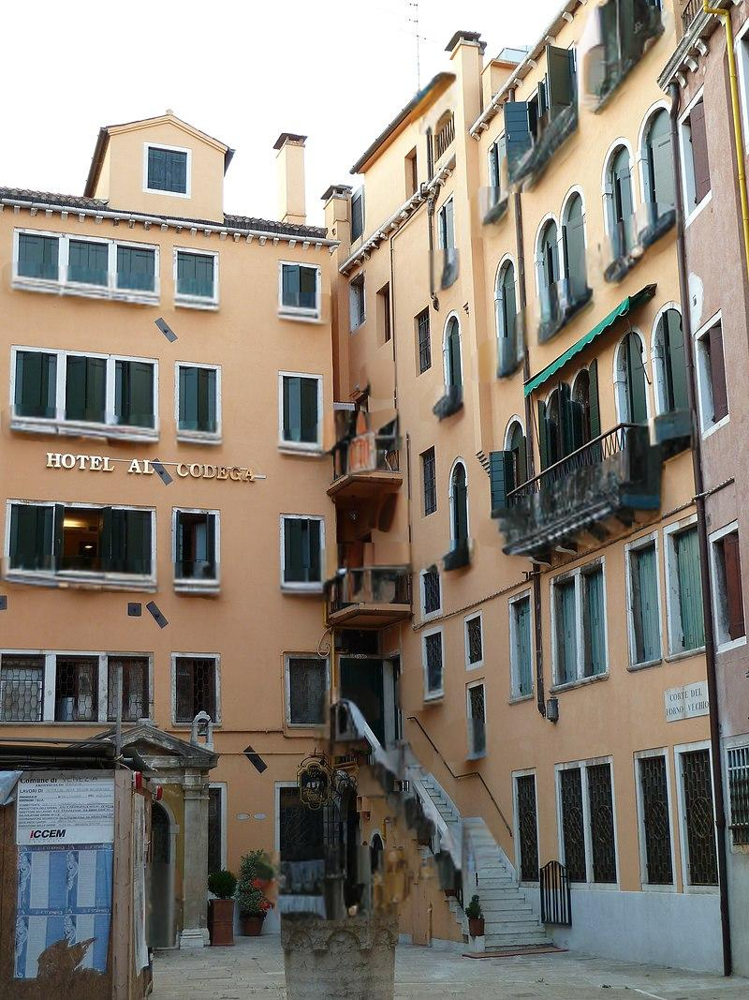

In [24]:
from IPython.display import display
img = read_image(30220815)
ptb_img = read_perturbed_img("30220815", "d5bbd7040dba11ecb1e81171463288e9", "0")
display(img)
display(ptb_img)

In [47]:
import json
with open(data_dir, 'r') as f:
    data = json.load(f)

val_data = {}
train_data = {}
for id,dict in data.items():
    if dict['Qcate'] == 'text':
        continue
    elif not len(dict['img_posFacts']) > 0:
        continue
    elif dict['split'] == 'val':
        val_data[id] = dict
    elif dict['split'] == 'train':
        train_data[id] = dict

print(len(val_data))

color_val_data = {}
for id,d in val_data.items():
    if d['Qcate'] == 'color':
        color_val_data[id] = d
        
print(len(color_val_data))

color_train_data = {}
for id,d in train_data.items():
    if len(d['img_posFacts']) < 2:
        continue
    if d['Qcate'] == 'color':
        color_train_data[id] = d

print(len(color_train_data))


2511
179
452


In [70]:

def get_val_answer(qid, data, model, image_processor, tokenizer, device, use_ptb_img = False):
    ques = data['Q']
    images = []
    titles = []
    texts = []
    for img in data['img_posFacts']:
        image_id = img['image_id']
        # We only have the first perturbed image which should be enough to change the answer
        if use_ptb_img and len(images) == 0:
            images.append(read_perturbed_img(str(image_id), qid, "0"))
        else:
            images.append(read_image(image_id))
        display(images[-1])
        titles.append(img['caption'])
    for txt in data['txt_posFacts']:
        texts.append(txt['fact'])
        
    # skip if no images
    if len(images) == 2:
        promptImg = get_multihop_image_prompt(titles)
    elif len(images) == 1:
        promptImg = get_si_prompt(titles)
    else:
        return ""

    promptTxt = ""
    if len(texts) == 2:
        promptTxt = get_multihop_text_prompt(texts)
    elif len(texts) == 1:
        promptTxt = get_single_text_prompt(texts)
    
    prompt = promptImg + promptTxt + get_ques_prompt(ques)
    image_tensors = process_images(images, image_processor, model.config)
    image_tensors = [_image.to(dtype=torch.float16, device=device) for _image in image_tensors]
    
    conv_template = "qwen_1_5"
    conv = copy.deepcopy(conv_templates[conv_template])
    conv.append_message(conv.roles[0], prompt)
    conv.append_message(conv.roles[1], None)
    prompt_question = conv.get_prompt()
    print(f"Q: {prompt_question}")
    input_ids = tokenizer_image_token(prompt_question, tokenizer, IMAGE_TOKEN_INDEX, return_tensors="pt").unsqueeze(0).to(device)
    image_sizes = [image.size for image in images]
    # Generate response
    cont = model.generate(
        input_ids,
        images=image_tensors,
        image_sizes=image_sizes,
        do_sample=False,
        temperature=0,
        max_new_tokens=4096,
    )
    text_outputs = tokenizer.batch_decode(cont, skip_special_tokens=True)
    return text_outputs[0]


['"The Brazilian tapir and the Candian Lynx are both grey."']


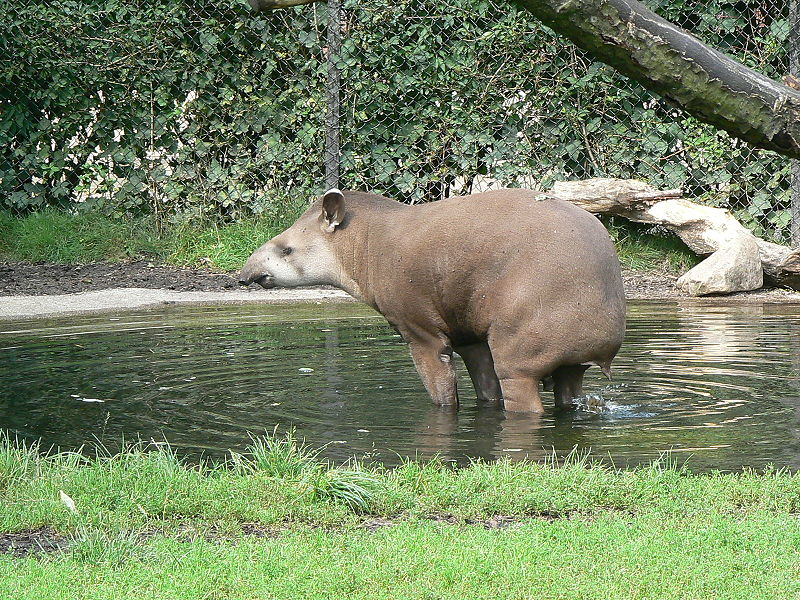

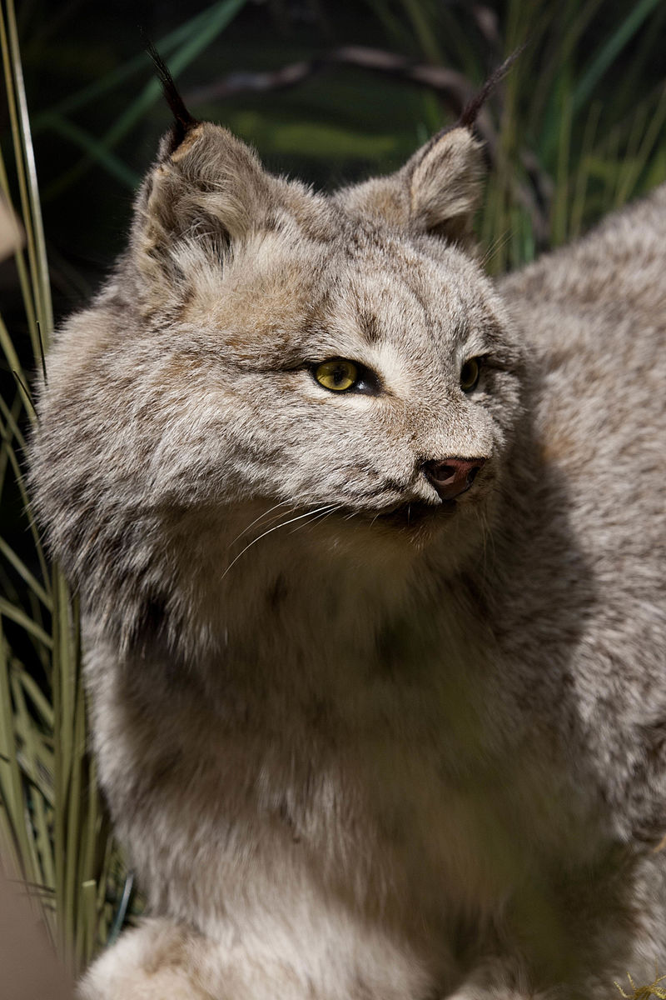

Q: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
<image> This is the first image.
Title: Brazilian tapir zoo hamburg

Now, let's look at another image: <image> Title: Canadian lynx Canadian lynx on exhibit
Given all of the relevant context before, respond with the correct answer to the following question in a complete sentence. Question: "What color do the Brazilian tapir and the Candian Lynx have in common with each other?"<|im_end|>
<|im_start|>assistant

A: The Brazilian tapir and the Candian Lynx are both grey.


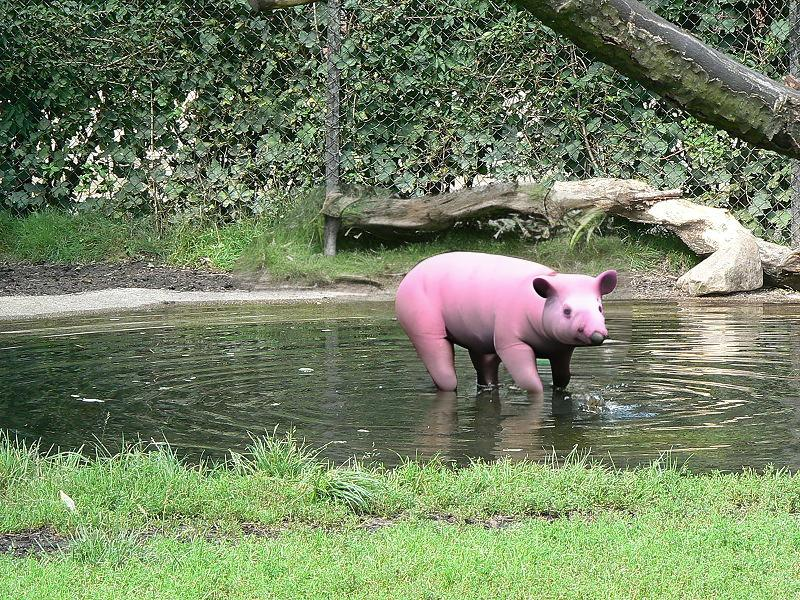

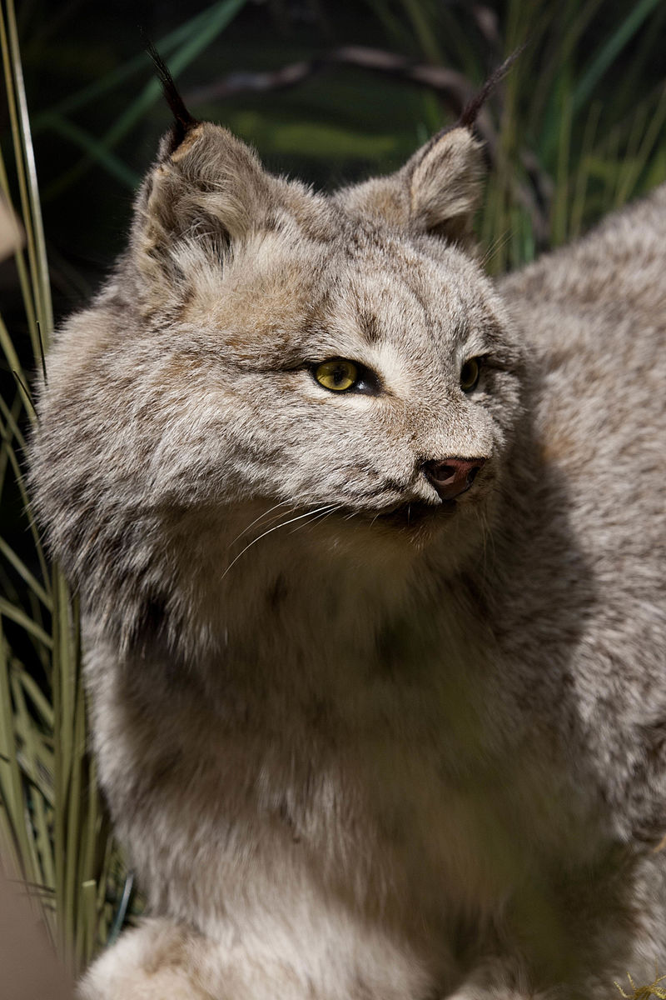

Q: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
<image> This is the first image.
Title: Brazilian tapir zoo hamburg

Now, let's look at another image: <image> Title: Canadian lynx Canadian lynx on exhibit
Given all of the relevant context before, respond with the correct answer to the following question in a complete sentence. Question: "What color do the Brazilian tapir and the Candian Lynx have in common with each other?"<|im_end|>
<|im_start|>assistant

A: The Brazilian tapir and the Candian Lynx are both grey.


In [71]:
sample_qid = "d5be1f3c0dba11ecb1e81171463288e9"
print(color_train_data[sample_qid]['A'])
ans1 = get_val_answer(sample_qid, color_train_data[sample_qid], model, image_processor, tokenizer, device, use_ptb_img=False)
print(f"A: {ans1}")
ans2 = get_val_answer(sample_qid, color_train_data[sample_qid], model, image_processor, tokenizer, device, use_ptb_img=True)
print(f"A: {ans2}")

In [65]:
list(color_train_data.keys())[10:20]

['d5bd52b40dba11ecb1e81171463288e9',
 'd5bdd5360dba11ecb1e81171463288e9',
 'd5be02fe0dba11ecb1e81171463288e9',
 'd5be1f3c0dba11ecb1e81171463288e9',
 'd5be31de0dba11ecb1e81171463288e9',
 'd5be69d80dba11ecb1e81171463288e9',
 'd5be722a0dba11ecb1e81171463288e9',
 'd5be7ffe0dba11ecb1e81171463288e9',
 'd5bef0a60dba11ecb1e81171463288e9',
 'd5bf0bd60dba11ecb1e81171463288e9']